# SpatialData on the example of a medulloblastoma sample

This tutorial explains basic [SpatialData](https://spatialdata.scverse.org/en/latest/index.html) operations and analysis:
* reading and saving files
* structure and contents of a SpatialData object
* visualisation of images, segmentations (shapes), gene expression, and annotations
* modifications: cropping, rotating and translating
* analysis using scanpy and squidpy

Additional and more in-depth tutorials are available at:
https://spatialdata.scverse.org/en/latest/tutorials/notebooks/notebooks.html

Information about the different functions of the SpatialData API is given here:
https://spatialdata.scverse.org/en/stable/api.html

Tutorials about analysis of spatial transcriptomics using scanpy and squidpy are available here (NOTE: not all of the are using SpatialData):
https://squidpy.readthedocs.io/en/stable/notebooks/tutorials/index.html

## Installation

For detailed installation instructions see: https://spatialdata.scverse.org/en/latest/installation.html and https://squidpy.readthedocs.io/en/stable/installation.html

To install the packages that are required for this tutorial, run the following commands (NOTE: this will only work inside the notebook if you run jupyter-lab locally or on Google colab):

In [ ]:
!pip install spatialdata
!pip install spatialdata-io
!pip install spatialdata-plot
!pip install squidpy

## Dataset
In this tutorial, we are investigating a human medulloblastoma 10X Genomics Xenium sample. This sample is part of the study:

Rademacher et al. (2024) _Comparison of spatial transcriptomics technologies for medulloblastoma cryosections_

The whole data set can be downloaded from the BioImageArchive (accession: S-BIAD1093) under a Creative Commons licencse (CC BY 4.0): https://www.ebi.ac.uk/biostudies/bioimages/studies/S-BIAD1093

For the sake of simplicity, we are only using the sample _MB299_. The data has already been downloaded and files have been renamed. The prefix 'MB299-' has been removed from the file names. This is necessary for the SpatialData file reader to recognize the file names.
You can find the data set at the following directory:

In [1]:
path_xenium = "/storage/nhecker/spatial/data/bia/S-BIAD1093/xenium/MB299"

These files are the typical output of the 10X Genomics Xenium Onboard Analysis Software (https://www.10xgenomics.com/support/software/xenium-onboard-analysis/latest/algorithms-overview/xoa-algorithms). Among others, this includes the following files related to:
* DAPI staining images: morphology_mip.ome.tif, morphology_focus.ome.tif
* Nuclei and cell segmentation: nucleus_boundaries.parquet, nucleus_boundaries.csv.gz, cell_boundaries.parquet, cell_boundaries.csv.gz
* Detected transcripts: transcripts.parquet, transcripts.csv.gz
* Cell-based count matrix: cell_feature_matrix.h5
* Summary and processing: analysis_summary.html, metrics_summary.csv

In [2]:
import os

os.listdir(path_xenium)

['cell_feature_matrix.zarr.zip',
 'gene_panel.json',
 'README.md',
 'cell_boundaries.parquet',
 'analysis.zarr.zip',
 'transcripts.csv.gz',
 'experiment.xenium',
 'morphology_mip.ome.tif',
 'morphology_focus.ome.tif',
 'log_ftp_MB299_S-BIAD1093-unix-ftp.log',
 'analysis_summary.html',
 'cells.zarr.zip',
 'cell_boundaries.csv.gz',
 'cells.parquet',
 'nucleus_boundaries.csv.gz',
 'metrics_summary.csv',
 'transcripts.parquet',
 'MB299_S-BIAD1093-unix-ftp.txt',
 'cells.csv.gz',
 'transcripts.zarr.zip',
 'nucleus_boundaries.parquet',
 'cell_feature_matrix.h5']

## Loading and saving files

In [3]:
import warnings
warnings.filterwarnings('ignore')

import spatialdata as sd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

Before we start looking at the data, we defining an output directory where we will store the initial SpatialData object: 

In [4]:
import os

outdir = "/storage/nhecker/spatial/data/bia/S-BIAD1093/xenium/"
path_spatialdata = outdir + "/MB299.zarr"

os.makedirs(outdir, exist_ok=True)

Next, we are using the SpatialData reader for Xenium data. The readers are part of the 'spatialdata-io' package. Have look at following URL to see currently supported technologies: https://spatialdata.scverse.org/projects/io/en/latest/

We read the Xenium into SpatialData object `sdata`:

In [5]:
from spatialdata_io import xenium

sdata = xenium(path_xenium)

This will created a SpatialData object, which is stored in memory. We will write the object in Zarr format to the disk. Zarr is a very efficient format for working with large data sets on distributed systems such as cloud computing, for details see: https://zarr.dev/.

In [6]:
sdata.write(path_spatialdata)

An advantage of the Zarr format is that we do not have to store the entire object in memory; but only the index to the files and parts that we are currently working with. This is in particular important for working with large spatial transcriptomics datasets. Currently, the entire SpatialData object is stored in memory. To make use of the memory-reducing Zarr functionality, we are reading the saved Zarr object and replace 'sdata' with it:

In [7]:
sdata = sd.read_zarr(path_spatialdata)

**A note on reading and saving SpatialData objects**: to avoid collisions, you cannot overwrite a SpatialData object while you are working with it. 
This means that you should always save a SpatialData object to a path that differs from the one that you used to read it from. 
You can, however, overwrite an existing SpatialData object if you did not load it in memory by specifying the `overwrite=True` flag.

The SpatialData objects contains the following entries:

In [8]:
sdata

SpatialData object, with associated Zarr store: /storage/nhecker/spatial/data/bia/S-BIAD1093/xenium/MB299.zarr
├── Images
│     ├── 'morphology_focus': DataTree[cyx] (1, 23866, 45409), (1, 11933, 22704), (1, 5966, 11352), (1, 2983, 5676), (1, 1491, 2838)
│     └── 'morphology_mip': DataTree[cyx] (1, 23866, 45409), (1, 11933, 22704), (1, 5966, 11352), (1, 2983, 5676), (1, 1491, 2838)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (23866, 45409), (11933, 22704), (5966, 11352), (2983, 5676), (1491, 2838)
│     └── 'nucleus_labels': DataTree[yx] (23866, 45409), (11933, 22704), (5966, 11352), (2983, 5676), (1491, 2838)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 10) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (262183, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (262183, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (262183, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (262183, 345)
with coo

* Images: two versions of the DAPI image, a focus ('morphology_focus') and maximum intensity projection ('morphology_mip') in five different resolutions
* Labels: based on initial clustering NOTE: we can ignore the labels as we will re-compute clusters in steps below.
* Points: the actual coordinates of detected 'transcripts'
* Shapes: segmentations as polygons of the nuclei ('nucleus_boundaries'), cells ('cell_boundaries') and as circles for cells ('cell_circles')
* 'Tables': an AnnData object that contains the cell-based count matrix and meta information for cells and transcripts
* 'coordinate systems': this relates to the common coordinates between the images and shapes. In this tutorial, we will only be working with the single 'global' coordinate system

Let us look at the 'table' AnnData object now.

In [9]:
sdata['table']

AnnData object with n_obs × n_vars = 262183 × 345
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'cell_labels'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

This object contains entries for 262,183 segmented cells ('n_obs') and 345 probes, i.e. genes in this case ('n_vars').

* 'obs': a data frame with meta information and metrics for each cell
* 'var': a data frmae that contains information for each gene
* 'uns': contains additional information, which does not fit into the 'obs' or 'var' data frame format
* 'obsm': matrices related to the cells. For example, 'spatial' comprises the spatial coordinates of each cell

The count matrix in the form of a sparse matrix is inside the 'X' entry.

In [10]:
sdata['table'].X

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 15294753 stored elements and shape (262183, 345)>

The 'var' data frame contains the gene names as an index and ENSEMBL gene IDs:

In [11]:
sdata['table'].var

,gene_ids,feature_types,genome
ABCC9,ENSG00000069431,Gene Expression,Unknown
ADAMTS12,ENSG00000151388,Gene Expression,Unknown
ADAMTS16,ENSG00000145536,Gene Expression,Unknown
ADAMTS3,ENSG00000156140,Gene Expression,Unknown
ADRA1A,ENSG00000120907,Gene Expression,Unknown
...,...,...,...
VWC2L,ENSG00000174453,Gene Expression,Unknown
WIF1,ENSG00000156076,Gene Expression,Unknown
ZBBX,ENSG00000169064,Gene Expression,Unknown
ZDHHC23,ENSG00000184307,Gene Expression,Unknown


The 'obs' data frame comprises entries such as the cell IDs, metrics including the number of transcripts per cell ('transcript_counts') and Xenium quality score related entries ('control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts' and 'deprecated_codeword_counts').

In [12]:
sdata['table'].obs

,cell_id,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,region,cell_labels
0,aaaafocd-1,149,0,0,0,0,149,114.606567,57.529065,cell_circles,1
1,aaabahcp-1,63,0,0,0,0,63,44.117658,22.984532,cell_circles,2
2,aaabanlf-1,65,0,0,0,0,65,51.568439,42.492033,cell_circles,3
3,aaabjamo-1,142,0,0,0,0,142,58.883752,51.703908,cell_circles,4
4,aaabjjjd-1,104,0,0,0,0,104,47.323752,40.730939,cell_circles,5
...,...,...,...,...,...,...,...,...,...,...,...
262178,oikblgea-1,55,1,0,0,0,56,947.016909,27.771095,cell_circles,262179
262179,oikbmnfo-1,30,0,0,0,0,30,986.709255,34.860626,cell_circles,262180
262180,oikcdmjp-1,82,0,0,0,0,82,799.446279,3.883438,cell_circles,262181
262181,oikcekan-1,76,1,0,0,0,77,1019.492693,29.487032,cell_circles,262182


## Images and shapes

To visualise images, shapes, and data, we are using the 'spatialdata-plot' package. This package has to be loaded for plotting functions to work properly.

In [13]:
import spatialdata_plot

Properties of images can be inspected with the `get_pyramid_levels` command. 'n' will select the different the resolutions of the image.

In [14]:
sd.get_pyramid_levels(sdata["morphology_focus"], n=0)

<xarray.DataArray 'image' (c: 1, y: 23866, x: 45409)> Size: 2GB
dask.array<from-zarr, shape=(1, 23866, 45409), dtype=uint16, chunksize=(1, 4096, 4096), chunktype=numpy.ndarray>
Coordinates:
  * c        (c) int64 8B 0
  * y        (y) float64 191kB 0.5 1.5 2.5 3.5 ... 2.386e+04 2.386e+04 2.387e+04
  * x        (x) float64 363kB 0.5 1.5 2.5 3.5 ... 4.541e+04 4.541e+04 4.541e+04
Attributes:
    transform:  {'global': Identity }

This shows us that 'morphology_focus' is a 2D image with a single channel ('c') with a width of 45,409 and height of 23,866. The 'transform' entry 'Identity' means that no transformation has been applied to this image.

`get_channel_names` can be used to retrieve the names of channels. In this case, there is a single channel called 0.

In [15]:
sd.models.get_channel_names(sdata["morphology_focus"])

[0]

Visualising images in SpatialData is done by following steps:
1) you specify which image to render and the color map ('cmap') that should be used: `pl.render_images(..)`
2) you create the plot: `pl.show(..)`

INFO     Rasterizing image for faster rendering.                                                                   


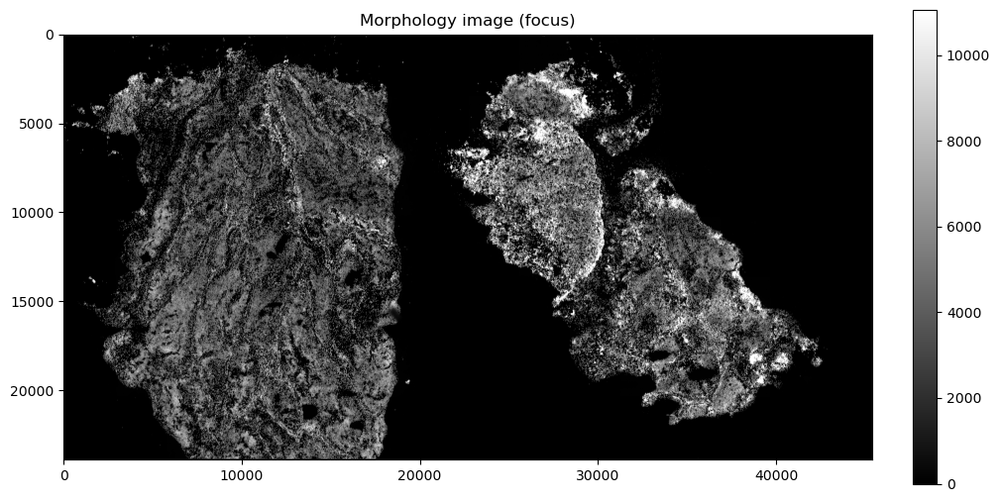

In [16]:
sdata.pl.render_images("morphology_focus", cmap="gray").pl.show(title=f"Morphology image (focus)", coordinate_systems="global", figsize=(10, 5))

We can see two distinct pieces of tissue in this plot.

Instead of plotting a gray image on black background you can specify another color map like "Purples"'. You can find available colormaps here: https://matplotlib.org/stable/gallery/color/colormap_reference.html

INFO     Rasterizing image for faster rendering.                                                                   


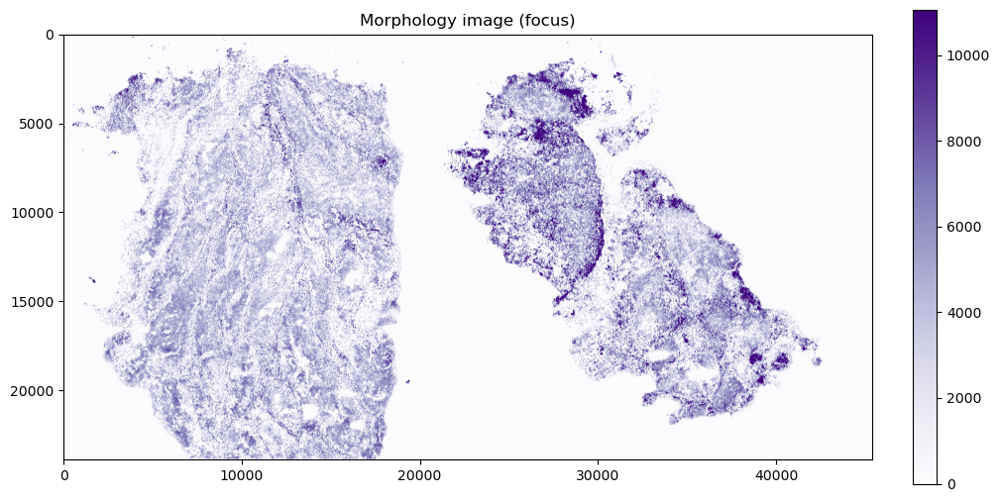

In [17]:
sdata.pl.render_images("morphology_focus", cmap="Purples").pl.show(title=f"Morphology image (focus)", coordinate_systems="global", figsize=(10, 5))

INFO     Rasterizing image for faster rendering.                                                                   


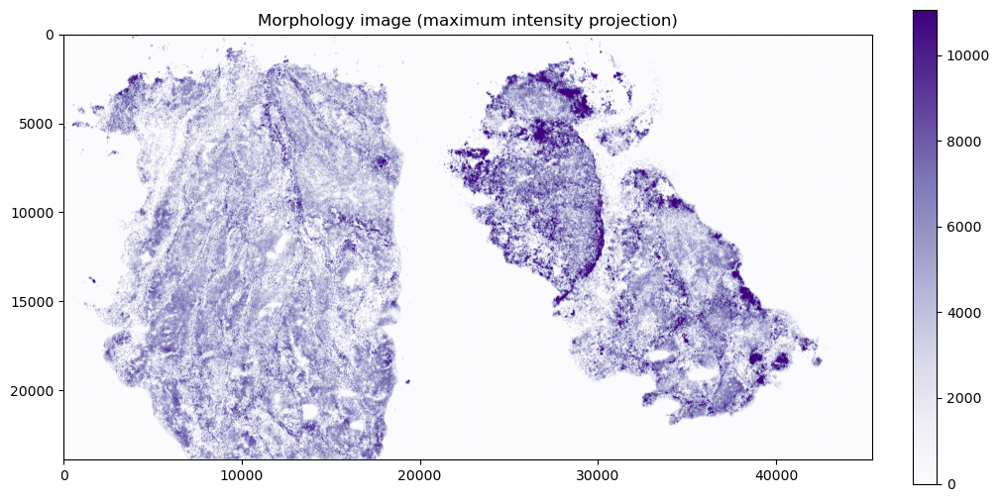

In [18]:
sdata.pl.render_images("morphology_mip", cmap="Purples").pl.show(title=f"Morphology image (maximum intensity projection)", coordinate_systems="global", figsize=(10, 5))

To render segmentations (shapes) instead of the DAPI images, you can use the `pl.render_shapes` command.

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


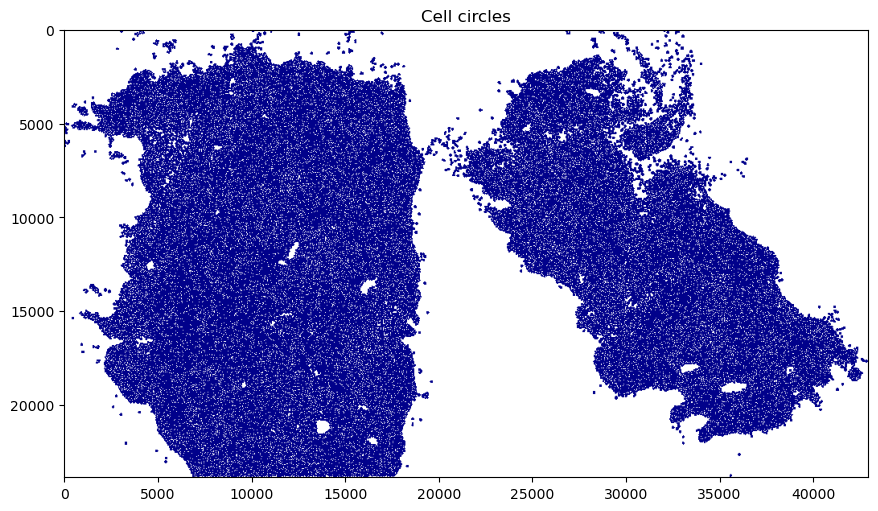

In [19]:
sdata.pl.render_shapes("cell_circles", color="darkblue").pl.show(title=f"Cell circles", coordinate_systems="global", figsize=(10, 5))

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


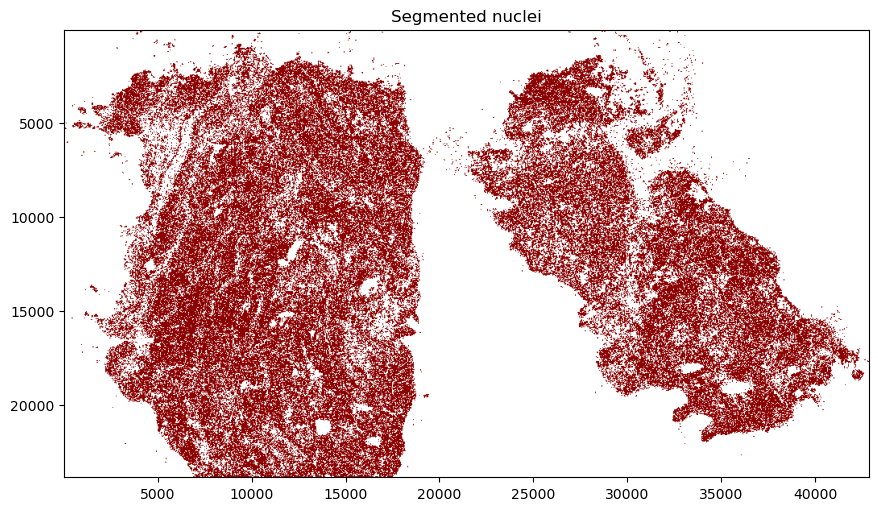

In [20]:
sdata.pl.render_shapes("nucleus_boundaries", color="darkred").pl.show(title=f"Segmented nuclei", coordinate_systems="global", figsize=(10, 5))

You can also stitch `pl.render_images` and `pl.render_shapes` commands together, for example, to plot segmented nuclei on the DAPI image.

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Rasterizing image for faster rendering.                                                                   
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


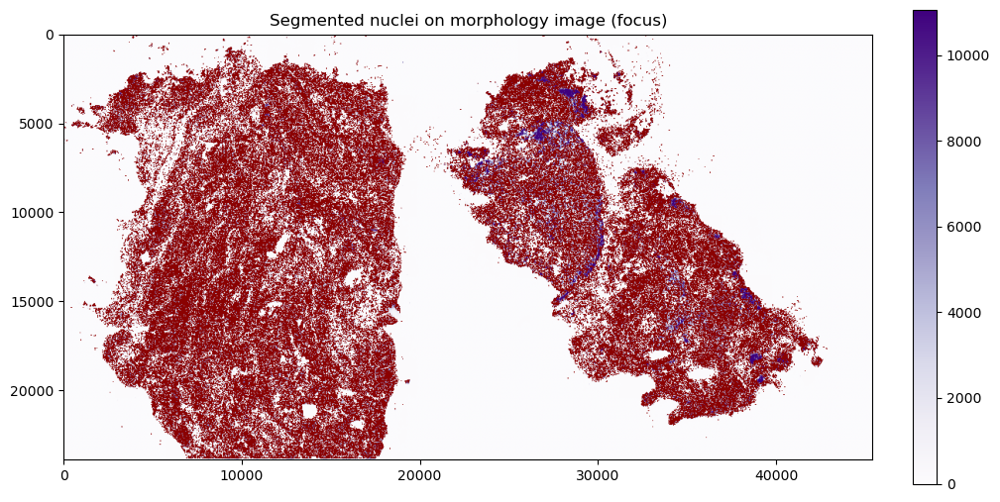

In [21]:
sdata.pl.render_images("morphology_focus", cmap="Purples").pl.render_shapes("nucleus_boundaries", color="darkred").pl.show(title=f"Segmented nuclei on morphology image (focus)", coordinate_systems="global", figsize=(10, 5))

## Transformations

Transformations are core features of SpatialData. These transformations include:

* Crop a SpatialData object. This will subset the object.
* Scale images and shapes
* Rotate images and shapes
* Translate images and shapes

Scale, rotation, and translation operations are applied to a specific instance (e.g. the morphology image) and coordinate system. Instead of directly modifying coordinates of the input images and shapes, SpatialData objects save the active transformations and apply them.

### Crop SpatialData objects

The `bounding_box_query` is a handy command to crop the SpatialData object. To reduce the required compute resources for this tutorial, we will crop out the left tissue piece and and only use that one for the subsequent steps.

To crop out this tissue piece we use a bounding box with a maxium x-coordinate of 20,000. We store the cropped object in 'crop_sdata':

In [22]:
crop_sdata = sd.bounding_box_query(
    sdata, axes=("x", "y"), min_coordinate=[0, 0], max_coordinate=[20000, 23866], target_coordinate_system="global"
)
crop_sdata

SpatialData object
├── Images
│     ├── 'morphology_focus': DataTree[cyx] (1, 23866, 20000), (1, 11933, 10000), (1, 5966, 5000), (1, 2983, 2500), (1, 1491, 1250)
│     └── 'morphology_mip': DataTree[cyx] (1, 23866, 20000), (1, 11933, 10000), (1, 5966, 5000), (1, 2983, 2500), (1, 1491, 1250)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (23866, 20000), (11933, 10000), (5966, 5000), (2983, 2500), (1491, 1250)
│     └── 'nucleus_labels': DataTree[yx] (23866, 20000), (11933, 10000), (5966, 5000), (2983, 2500), (1491, 1250)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 10) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (166114, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (166112, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (166112, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (166112, 345)
with coordinate systems:
    ▸ 'global', with elements:
        morphology_focus (Images), morphology_mi

As you can see, the 'bounding_box_query' did not only crop the images and shapes but also reduced the AnnData object to roughly of the cells (166,122 cells instead of the intial 262,183 cells).

Currently, the cropped object will be stored in memory. We will save this cropped object as another Zarr on the disk.

In [23]:
outdir = "/storage/nhecker/spatial/data/bia/S-BIAD1093/xenium/"
path_cr_spatialdata = outdir + "/cropped_MB299.zarr"

crop_sdata.write(path_cr_spatialdata)

To free memory, we will reload the object from  zarr files.

In [24]:
crop_sdata = sd.read_zarr(path_cr_spatialdata)

And free the memory from the initial SpatialData object.

In [25]:
del sdata

If we plot the morphology image now, it only shows the left tissue piece.

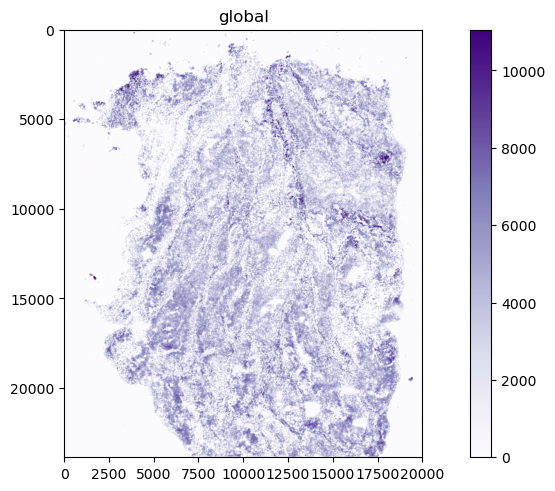

In [26]:
crop_sdata.pl.render_images("morphology_focus", cmap="Purples").pl.show()

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


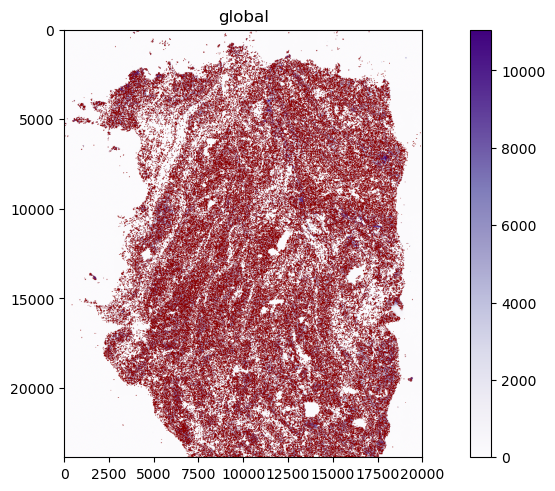

In [27]:
crop_sdata.pl.render_images("morphology_focus", cmap="Purples").pl.render_shapes("nucleus_boundaries", color="darkred").pl.show()

### Rotate and translate images and shapes

SpatialData operations can be used to rotate and translate images and shapes.

For convenience, we create a function `get_xy_rotation_by_degrees` that takes degrees as input and returns a SpatialData rotation.

In [28]:
import math
import spatialdata as sd

def get_xy_rotation_by_degrees(degrees: float, small_digits: int=15) -> sd.transformations.transformations.Affine: 
    """
    Generates a SpatialData rotation on x-axis and y-axis using degrees as input.

    Parameters
    ----------
    degrees: float
        The number degrees images and shapes should be rotated
    small_digits: int 
        The number of digits to consider for sine and cosine computation to avoid numerical noise

    Returns
    -------
    sd.transformations.transformations.Affine
        SpatialData rotation that can be applied to SpatialData instances (images and shapes)
    """
    
    rad = math.radians(degrees)

    rotation = sd.transformations.Affine(
        [
            [round(math.cos(rad), small_digits), -round(math.sin(rad), small_digits), 0],
            [round(math.sin(rad), small_digits), round(math.cos(rad), small_digits), 0],
            [0, 0, 1],
        ],
        input_axes=("x", "y"),
        output_axes=("x", "y"),
    )

    return rotation

SpatialData rotations are defined as a matrix. For instance, for a 90 degrees rotation our function generates the following rotation matrix:

In [29]:
get_xy_rotation_by_degrees(90)

Affine (x, y -> x, y)
    [ 0. -1.  0.]
    [1. 0. 0.]
    [0. 0. 1.]

Before we apply this transformation, we should check whether other transformations have already been applied to the image or segmentation (shape). We would overwrite existing transformation otherwise. Existing transformations can be checked with `transformations.get_transformation` command.

In [30]:
sd.transformations.get_transformation(crop_sdata.images["morphology_focus"])

Identity 

'Identity' means no transformations has been applied to morphology image so far.

In [31]:
sd.transformations.get_transformation(crop_sdata.shapes["cell_circles"])

Scale (x, y)
    [4.70588235 4.70588235]

However, the cell circles have already been scaled. We have to make sure that we scale them when specifying new transformations.

Let us first apply a 90 degrees rotation to the morphology focus image. This is done by using the `set_transformation` command.

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                     

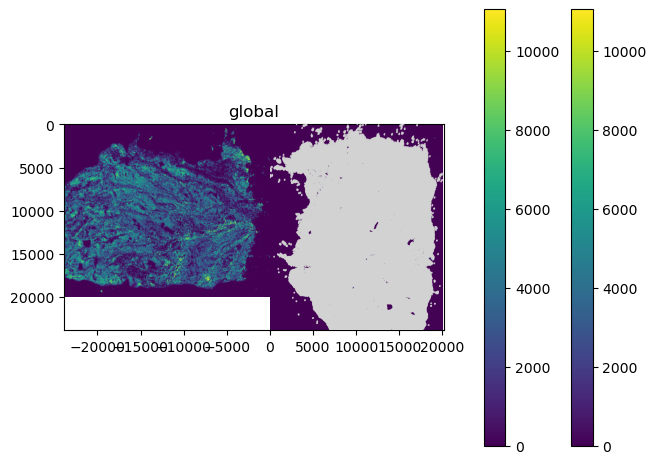

In [32]:
rotation = get_xy_rotation_by_degrees(90)

sd.transformations.set_transformation(crop_sdata.images["morphology_focus"], rotation, to_coordinate_system="global")

crop_sdata.pl.render_images().pl.render_labels().pl.render_shapes().pl.show()

After rendering all images, labels, and shapes, we can see that the morphology image has been rotated but not the other images, labels, and shapes.

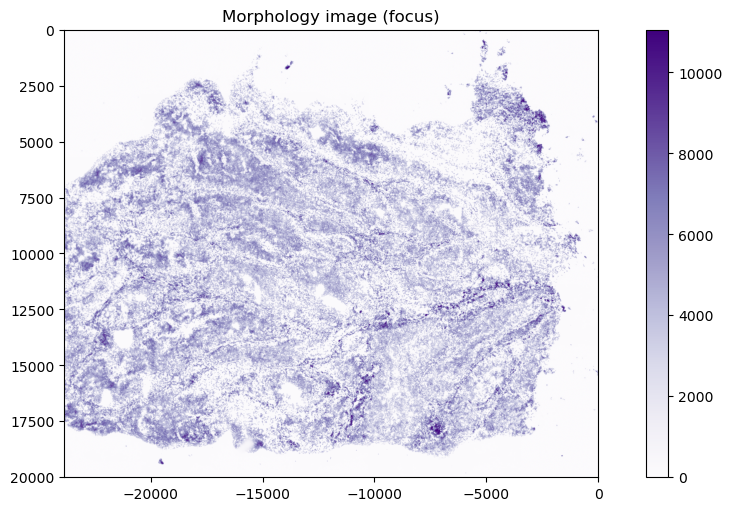

In [33]:
crop_sdata.pl.render_images("morphology_focus", cmap="Purples").pl.show(title=f"Morphology image (focus)", coordinate_systems="global", figsize=(10, 5))

The morphology image exhibits some negative x-coordinates due to the rotation. We can get the maximum and minimum x- and y-coordinates with the function `get_extent`:

In [34]:
sd.get_extent( crop_sdata.images['morphology_focus'] )

{'y': (np.float64(0.0), np.float64(20000.0)),
 'x': (np.float64(-23866.0), np.float64(0.0))}

To shift everything into non-negative coordinates, we can apply a translation to the x-axis based on the minimum x-coordinate using the `transformations.Translation` function:

In [35]:
translation = sd.transformations.Translation([23866, 0], axes=("x", "y"))

To rotate and then translate the morphology image, we have to specify a `transformations.Sequence`:

In [36]:
transf_sequence = sd.transformations.Sequence([rotation, translation])
transf_sequence

Sequence 
    Affine (x, y -> x, y)
        [ 0. -1.  0.]
        [1. 0. 0.]
        [0. 0. 1.]
    Translation (x, y)
        [23866.     0.]

In [37]:
sd.transformations.set_transformation(crop_sdata.images["morphology_focus"], transf_sequence, to_coordinate_system="global")

In [38]:
sd.transformations.get_transformation(crop_sdata.images["morphology_focus"])

Sequence 
    Affine (x, y -> x, y)
        [ 0. -1.  0.]
        [1. 0. 0.]
        [0. 0. 1.]
    Translation (x, y)
        [23866.     0.]

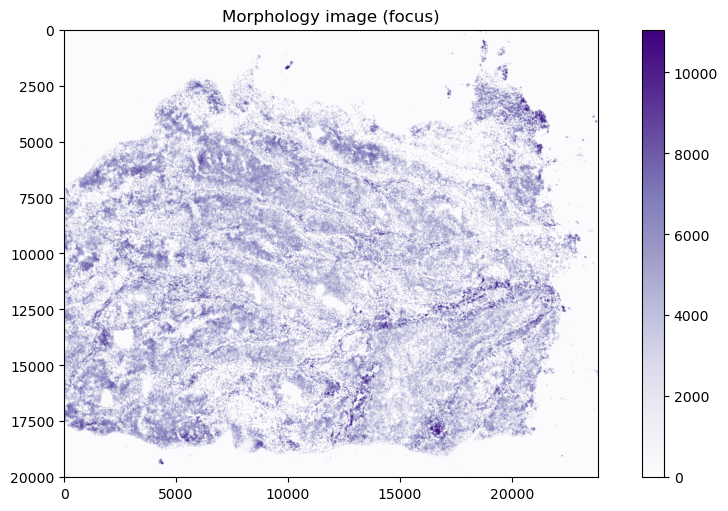

In [39]:
crop_sdata.pl.render_images("morphology_focus", cmap="Purples").pl.show(title=f"Morphology image (focus)", coordinate_systems="global", figsize=(10, 5))

The transformation sequence (rotating and translating) the image has beeen successfully applied.

For the cell circles, we have to include the already existing scale transformation in our sequence of transformations.

In [40]:
sd.transformations.get_transformation(crop_sdata.shapes["cell_circles"])

Scale (x, y)
    [4.70588235 4.70588235]

In [41]:
existing_transformations = sd.transformations.get_transformation(crop_sdata.shapes["cell_circles"])

In [42]:
existing_transformations

Scale (x, y)
    [4.70588235 4.70588235]

In [43]:
transf_sequence = sd.transformations.Sequence([existing_transformations, rotation, translation])
transf_sequence

Sequence 
    Scale (x, y)
        [4.70588235 4.70588235]
    Affine (x, y -> x, y)
        [ 0. -1.  0.]
        [1. 0. 0.]
        [0. 0. 1.]
    Translation (x, y)
        [23866.     0.]

In [44]:
sd.transformations.set_transformation(crop_sdata.shapes["cell_circles"], transf_sequence, to_coordinate_system="global")

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


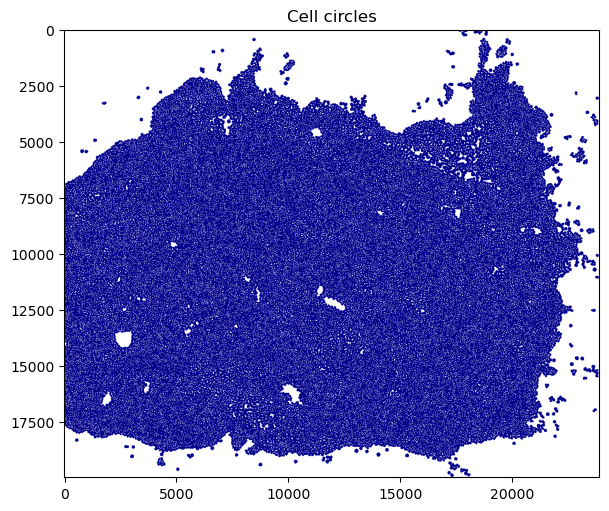

In [45]:
crop_sdata.pl.render_shapes("cell_circles", color="darkblue").pl.show(title=f"Cell circles", coordinate_systems="global", figsize=(10, 5))

## View gene expression

To view the expression of a gene, you can simply specify that the gene in the 'color' parameter of the `pl.render_shapes`. For example, here we show the expression of the neuron marker gene 'RBOFOX3'.

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


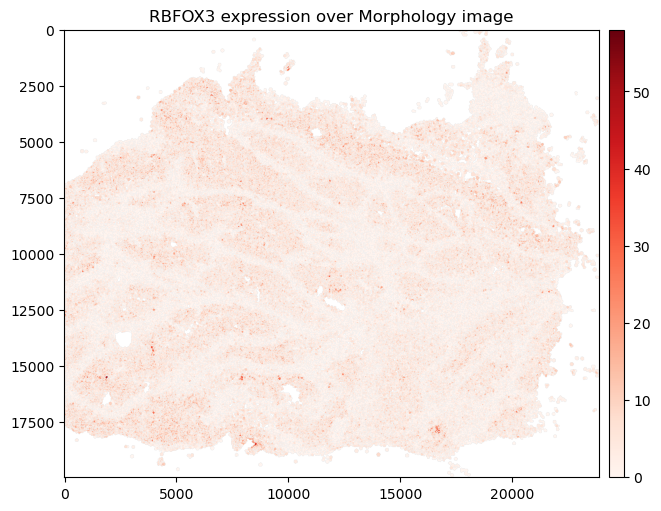

In [46]:
gene_name = "RBFOX3"
crop_sdata.pl.render_shapes(
    "cell_circles",
    color=gene_name,
    cmap="Reds"
).pl.show(title=f"{gene_name} expression over Morphology image", coordinate_systems="global", figsize=(10, 5))

... and the oncogene MYCN.

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


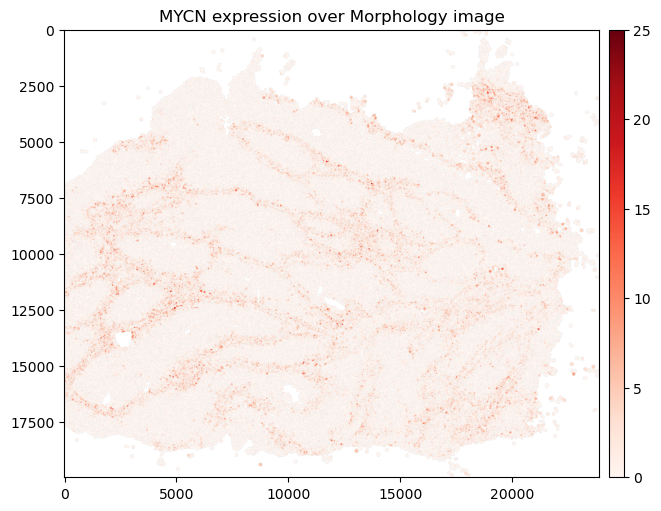

In [47]:
gene_name = "MYCN"
crop_sdata.pl.render_shapes(
    "cell_circles",
    color=gene_name,
    cmap="Reds"
).pl.show(title=f"{gene_name} expression over Morphology image", coordinate_systems="global", figsize=(10, 5))

### Quality control

SpatialData seamlessly integrates with [scanpy](https://scanpy.readthedocs.io/en/stable/) and [squidpy](https://squidpy.readthedocs.io/en/stable/). You can simply use scanpy and squidpy functions and apply them to the 'table' AnnData object inside the SpatialData objects.

Let us have a look again at the cell specific entries in the 'obs' dataframe.

In [48]:
crop_sdata['table'].obs

,cell_id,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,region,cell_labels
0,aaaafocd-1,149,0,0,0,0,149,114.606567,57.529065,cell_circles,1
1,aaabahcp-1,63,0,0,0,0,63,44.117658,22.984532,cell_circles,2
2,aaabanlf-1,65,0,0,0,0,65,51.568439,42.492033,cell_circles,3
3,aaabjamo-1,142,0,0,0,0,142,58.883752,51.703908,cell_circles,4
4,aaabjjjd-1,104,0,0,0,0,104,47.323752,40.730939,cell_circles,5
...,...,...,...,...,...,...,...,...,...,...,...
257182,oedkmpic-1,29,0,0,0,0,29,344.993763,13.592032,cell_circles,257183
257183,oedlajfm-1,76,0,0,0,0,76,659.687680,22.262032,cell_circles,257184
257184,oedlboie-1,56,0,0,0,0,56,687.323306,14.630626,cell_circles,257185
257185,oedldhbn-1,17,1,0,0,0,18,838.370968,7.360469,cell_circles,257186


Xenium specific quality scores can be computed based on the 'control_probe_counts' and 'control_codeword_counts':

In [49]:
cprobes = (
    crop_sdata['table'].obs["control_probe_counts"].sum() / crop_sdata['table'].obs["total_counts"].sum() * 100
)
cwords = (
    crop_sdata['table'].obs["control_codeword_counts"].sum() / crop_sdata['table'].obs["total_counts"].sum() * 100
)
print(f"Negative DNA probe count % : {cprobes}")
print(f"Negative decoding count % : {cwords}")


Negative DNA probe count % : 0.04504550350414359
Negative decoding count % : 0.0032244297892038893


The negative 

The scanpy command `pp.calculate_qc_metrics` can be used to compute QC metrics.

In [50]:
# Calculate QC metrics (assuming your table is named 'table')
sc.pp.calculate_qc_metrics(crop_sdata['table'], percent_top=None, log1p=False, inplace=True)

In [51]:
crop_sdata['table'].obs

,cell_id,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,region,cell_labels,n_genes_by_counts
0,aaaafocd-1,149,0,0,0,0,149.0,114.606567,57.529065,cell_circles,1,57
1,aaabahcp-1,63,0,0,0,0,63.0,44.117658,22.984532,cell_circles,2,35
2,aaabanlf-1,65,0,0,0,0,65.0,51.568439,42.492033,cell_circles,3,34
3,aaabjamo-1,142,0,0,0,0,142.0,58.883752,51.703908,cell_circles,4,58
4,aaabjjjd-1,104,0,0,0,0,104.0,47.323752,40.730939,cell_circles,5,52
...,...,...,...,...,...,...,...,...,...,...,...,...
257182,oedkmpic-1,29,0,0,0,0,29.0,344.993763,13.592032,cell_circles,257183,25
257183,oedlajfm-1,76,0,0,0,0,76.0,659.687680,22.262032,cell_circles,257184,44
257184,oedlboie-1,56,0,0,0,0,56.0,687.323306,14.630626,cell_circles,257185,37
257185,oedldhbn-1,17,1,0,0,0,17.0,838.370968,7.360469,cell_circles,257186,13


This adds a column for the number of genes per cell ('n_genes_by_counts') and the total number of detected transcripts ('total_counts').

To obtain an idea about the different levels of segmentation, we can compute the ratio between the area of the segmented nucleus and cell for each cell.

In [52]:
crop_sdata['table'].obs["nucleus_ratio"] = crop_sdata['table'].obs["nucleus_area"] / crop_sdata['table'].obs["cell_area"]

Violin plots can be used to investigate the distribution of these QC metrics all the cells.

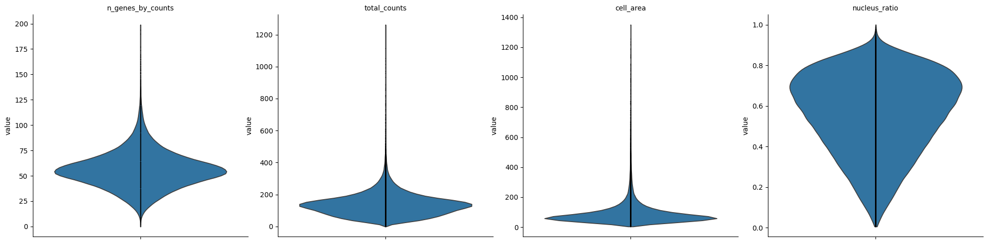

In [53]:
sc.pl.violin(
    crop_sdata['table'],
    ["n_genes_by_counts", "total_counts", "cell_area", "nucleus_ratio"],
    jitter=False,
    multi_panel=True,
)

Or they can be visualized visualised as histograms using the [seaborn](https://seaborn.pydata.org/) plotting framework.

<Axes: title={'center': 'Nucleus ratio'}, xlabel='nucleus_ratio', ylabel='Count'>

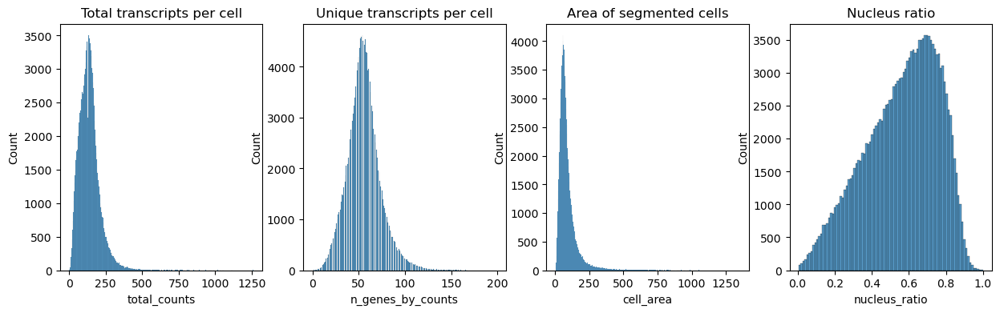

In [54]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    crop_sdata['table'].obs["total_counts"],
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    crop_sdata['table'].obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)


axs[2].set_title("Area of segmented cells")
sns.histplot(
    crop_sdata['table'].obs["cell_area"],
    kde=False,
    ax=axs[2],
)

axs[3].set_title("Nucleus ratio")
sns.histplot(
    crop_sdata['table'].obs["nucleus_ratio"],
    kde=False,
    ax=axs[3],
)

We can also plot QC metrics on the spatial coordinates by specifying them in the 'color' parameter when calling `pl.render_shapes`.

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


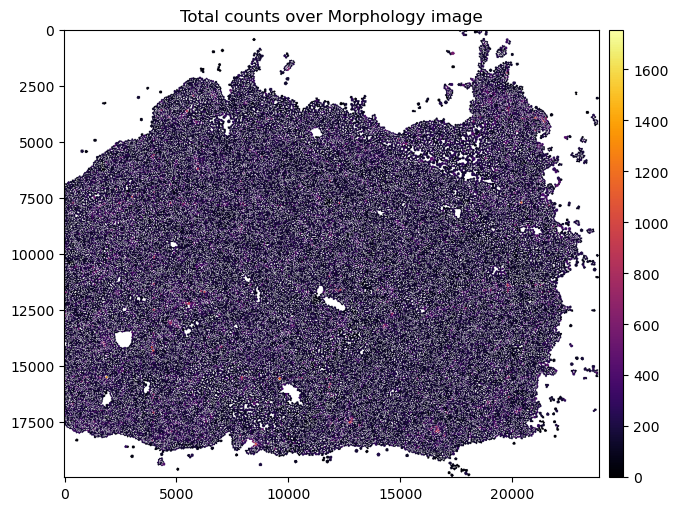

In [55]:
crop_sdata.pl.render_shapes(
    "cell_circles",
    color="total_counts",
    cmap="inferno"
).pl.show(title=f"Total counts over Morphology image", coordinate_systems="global", figsize=(10, 5))

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


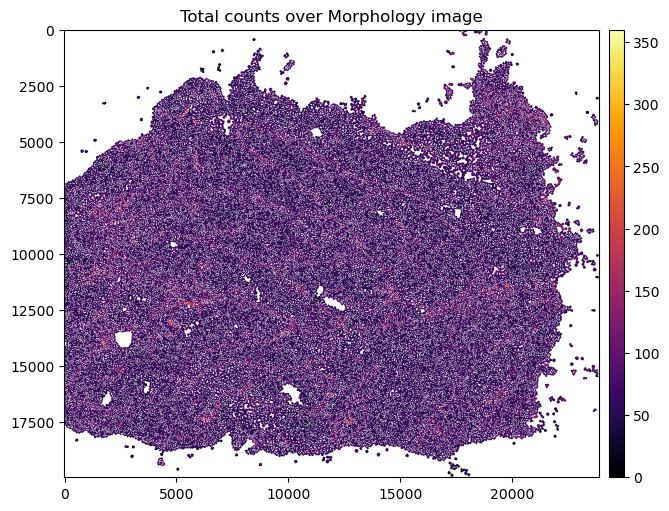

In [56]:
crop_sdata.pl.render_shapes(
    "cell_circles",
    color="n_genes_by_counts",
    cmap="inferno"
).pl.show(title=f"Total counts over Morphology image", coordinate_systems="global", figsize=(10, 5))

## Basic processing

Processing of spatial transcriptomics data is very similar to processing single cell data:

* Data normalisation
* PCA
* Clustering
* Cell type annotation (out of scope for this tutorial)
* Spatial transcriptomics data specific analysis such as identifying spatially variable genes

Since we will modify transcript counts per cell by normalising them, we store the raw counts into a layer called 'counts' in the AnnData object.

In [57]:
# saw raw counts
crop_sdata['table'].layers['counts'] = crop_sdata['table'].X.copy()

A simple way of normalisation, which usually works well, is to normalize all the counts per cell using the scanpy function `pp.normalize_total`. To deal with heteroscedasticy in the data, we usually log-normalise the data with the `pp.log1p` command. The scanpy framework also offers more sophsiticated functions for normalisation such as using [Pearson residuals](https://scanpy.readthedocs.io/en/stable/generated/scanpy.experimental.pp.normalize_pearson_residuals.html). 

In [58]:
sc.pp.normalize_total(crop_sdata.tables["table"])
sc.pp.log1p(crop_sdata.tables["table"])

### PCA

Principal component analysis (PCA) is a good start to identify genes that explain most of the variation in gene expression in a data set. The principal components will also be used downstream for clustering the cells. PCA often works best if it is limited to highly variable genes in the data set. We can detect highly variable genes with the scanpy command `pp.highly_variable_genes`.

In [59]:
sc.pp.highly_variable_genes(crop_sdata.tables["table"])

In [60]:
crop_sdata.tables["table"].var.sort_values("means", ascending=False)

,gene_ids,feature_types,genome,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm
NRXN3,ENSG00000021645,Gene Expression,Unknown,131748,5.807371,20.687247,964674.0,True,1.883054,1.268855,0.982282
RELN,ENSG00000189056,Gene Expression,Unknown,153071,5.630003,7.850727,935211.0,False,1.871562,0.828008,-0.073053
SV2B,ENSG00000185518,Gene Expression,Unknown,142824,5.532869,14.019457,919076.0,False,1.839561,1.044163,0.444396
APP,ENSG00000142192,Gene Expression,Unknown,159341,5.384054,4.076165,894356.0,False,1.816633,0.293073,-1.353624
SLC17A7,ENSG00000104888,Gene Expression,Unknown,127085,4.402247,23.494389,731266.0,True,1.655441,1.177323,1.154691
...,...,...,...,...,...,...,...,...,...,...,...
FOXJ1,ENSG00000129654,Gene Expression,Unknown,303,0.001842,99.817593,306.0,False,0.001895,0.310708,-0.964824
NWD2,ENSG00000174145,Gene Expression,Unknown,314,0.001908,99.810971,317.0,False,0.001882,0.343650,-0.824300
FASLG,ENSG00000117560,Gene Expression,Unknown,316,0.002029,99.809767,337.0,False,0.001854,0.318207,-0.932832
NPFFR2,ENSG00000056291,Gene Expression,Unknown,244,0.001487,99.853111,247.0,False,0.001509,0.358046,-0.762890


Among other columns it as flag 'highly_variable' in the 'var' dataframe.

The actual PCA is performed with the scanpy function `tl.pca`. Here, we specify that is limited to highly variably genes: 'use_highly_variable=True'

In [61]:
sc.tl.pca(crop_sdata.tables["table"], use_highly_variable=True)

Elbow plots show which PCs explain most of the data. We use the scanpy function `pl.pca_variance_ratio` to plot them.

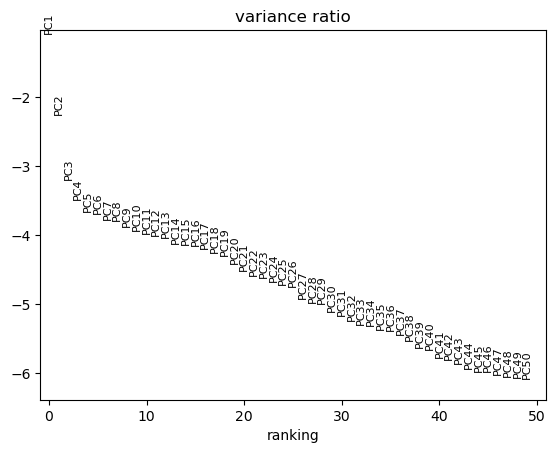

In [62]:
sc.pl.pca_variance_ratio(crop_sdata.tables["table"], n_pcs=50, log=True)

A first idea about interesting genes in our dataset can be obtained by looking at the loadings of the PCs.

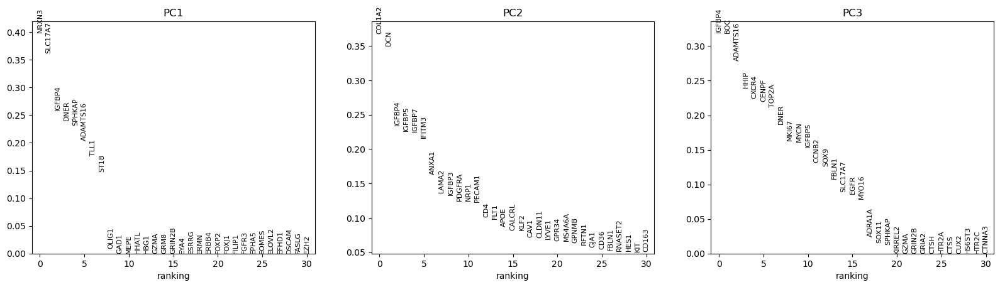

In [63]:
sc.pl.pca_loadings(crop_sdata.tables["table"], include_lowest=False)

We can plot them on top of the first two PCs with the scanpy function 'pl.pca'.

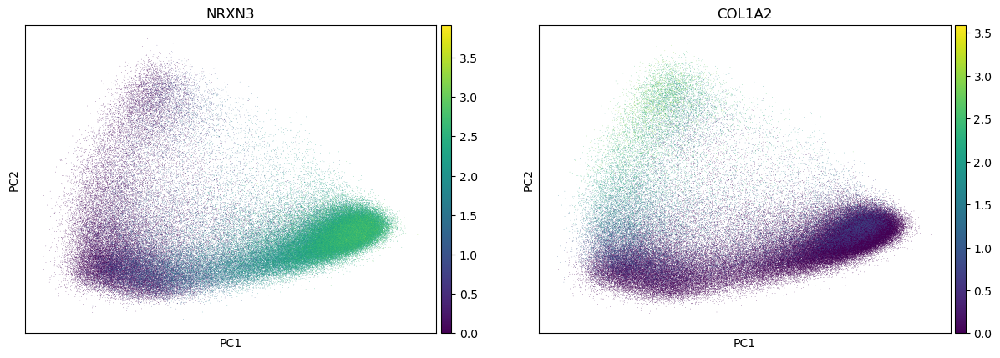

In [64]:
sc.pl.pca(
    crop_sdata.tables["table"], color=['NRXN3', 'COL1A2']
)

### Clustering

While PCs can provide interesting insights, UMAPs are often more usual to visualise how cells cluster together based on their expression profiles. UMAPs are computed based on a neighborhood graph that describes the similarities between cells. The neighborhood graph is computed with the scanpy function `pp.neighbors` and uses the PCs as input. UMAPs can then be computed the 'tl.umap' function.

In [65]:
sc.pp.neighbors(crop_sdata.tables["table"])
sc.tl.umap(crop_sdata.tables["table"])

Clusters are inferred from the neighborhood graph using Leiden clustering. The scanpy function `tl.leiden` takes the AnnData object as input. The clustering resolution can be specified by the 'resolution' parameter. It is advisable to try several different clustering resolution and inspect the UMAP. For simplicity, we just use the default resolution of 1 in this tutorial. 

In [66]:
sc.tl.leiden(crop_sdata.tables["table"], resolution=1)

IOStream.flush timed out


Per default the cluster assignment is simply added as 'leiden'in the 'obs' dataframe.

In [67]:
crop_sdata.tables["table"].obs

,cell_id,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,region,cell_labels,n_genes_by_counts,nucleus_ratio,leiden
0,aaaafocd-1,149,0,0,0,0,149.0,114.606567,57.529065,cell_circles,1,57,0.501970,4
1,aaabahcp-1,63,0,0,0,0,63.0,44.117658,22.984532,cell_circles,2,35,0.520983,8
2,aaabanlf-1,65,0,0,0,0,65.0,51.568439,42.492033,cell_circles,3,34,0.823993,8
3,aaabjamo-1,142,0,0,0,0,142.0,58.883752,51.703908,cell_circles,4,58,0.878067,3
4,aaabjjjd-1,104,0,0,0,0,104.0,47.323752,40.730939,cell_circles,5,52,0.860687,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257182,oedkmpic-1,29,0,0,0,0,29.0,344.993763,13.592032,cell_circles,257183,25,0.039398,5
257183,oedlajfm-1,76,0,0,0,0,76.0,659.687680,22.262032,cell_circles,257184,44,0.033746,5
257184,oedlboie-1,56,0,0,0,0,56.0,687.323306,14.630626,cell_circles,257185,37,0.021286,2
257185,oedldhbn-1,17,1,0,0,0,17.0,838.370968,7.360469,cell_circles,257186,13,0.008779,2


Multiple clusterings with different resolutions can be added by explicitly specifying the name for the clustering as the 'key_added' parameter.

In [68]:
sc.tl.leiden(crop_sdata.tables["table"], resolution=0.5, key_added='leiden_0.5')

In [69]:
crop_sdata.tables["table"].obs

,cell_id,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,region,cell_labels,n_genes_by_counts,nucleus_ratio,leiden,leiden_0.5
0,aaaafocd-1,149,0,0,0,0,149.0,114.606567,57.529065,cell_circles,1,57,0.501970,4,1
1,aaabahcp-1,63,0,0,0,0,63.0,44.117658,22.984532,cell_circles,2,35,0.520983,8,2
2,aaabanlf-1,65,0,0,0,0,65.0,51.568439,42.492033,cell_circles,3,34,0.823993,8,2
3,aaabjamo-1,142,0,0,0,0,142.0,58.883752,51.703908,cell_circles,4,58,0.878067,3,4
4,aaabjjjd-1,104,0,0,0,0,104.0,47.323752,40.730939,cell_circles,5,52,0.860687,6,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257182,oedkmpic-1,29,0,0,0,0,29.0,344.993763,13.592032,cell_circles,257183,25,0.039398,5,6
257183,oedlajfm-1,76,0,0,0,0,76.0,659.687680,22.262032,cell_circles,257184,44,0.033746,5,1
257184,oedlboie-1,56,0,0,0,0,56.0,687.323306,14.630626,cell_circles,257185,37,0.021286,2,2
257185,oedldhbn-1,17,1,0,0,0,17.0,838.370968,7.360469,cell_circles,257186,13,0.008779,2,2


`pl.umap` is the command for plotting UMAPs. Similarly to the other plotting functions, you can specify different metrics, clusterings, or genes in the 'color' parameter. 

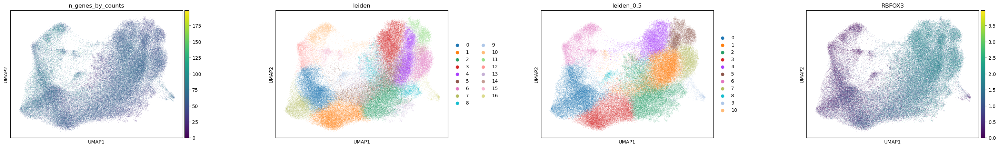

In [70]:
sc.pl.umap(
    crop_sdata.tables["table"],
    color=[
        "n_genes_by_counts",
        "leiden",
        "leiden_0.5",
        "RBFOX3",
    ],
    wspace=0.4,
)

Note that the clusterings are solely computed based on gene expression profiles of the cells with out considering any spatial information of the cells. 
However, these clusters often reflect cell types or states with distinct spatial locations as you can see when we plot them on the spatial coordinates.

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


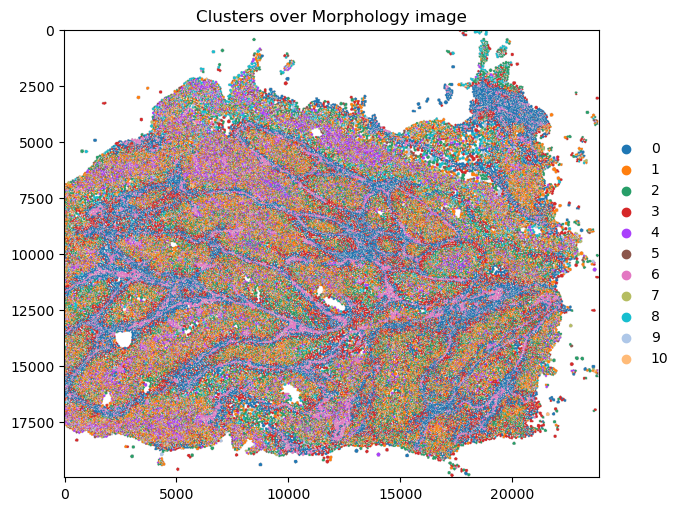

In [71]:
crop_sdata.pl.render_shapes(
    "cell_circles",
    color="leiden_0.5",
).pl.show(title=f"Clusters over Morphology image", coordinate_systems="global", figsize=(10, 5))

To make use of spatial properties of our data, we can use the [squidpy](https://squidpy.readthedocs.io/en/stable/) package. As an example, we will identify spatially variable genes. Squidpy contains a function for computing a spatial neighborhood graph 'gr.spatial_neighbors'.

In [72]:
import squidpy as sq

sq.gr.spatial_neighbors(crop_sdata.tables["table"], coord_type="generic", delaunay=True)

Spatially variable genes can be detected based on their spatial autocorrelation. An old but established statistic to detect spatial autocorrelation is [Moran's I](https://en.wikipedia.org/wiki/Moran%27s_I). Moran's I for all genes can be calculated with the `gr.spatial_autocorr` function that utlizes the spatial neighborhood graph.

In [73]:
sq.gr.spatial_autocorr(
    crop_sdata.tables["table"],
    mode="moran",
    n_perms=100,
    n_jobs=8,
)

  0%|                                                                                                                                         | 0/100 [00:00<?, ?/s]/home/nikolai/.conda/envs/scanpy/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/nikolai/.conda/envs/scanpy/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/nikolai/.conda/envs/scanpy/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: Futur

A ranked list of specially variable genes is stored inside the 'uns' entry 'moranI'.

In [74]:
crop_sdata.tables["table"].uns["moranI"].head(10)

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
NRXN3,0.653520,0.0,0.000002,0.0,0.009901,0.000004,0.0,0.0,0.009901
SLC17A7,0.595978,0.0,0.000002,0.0,0.009901,0.000004,0.0,0.0,0.009901
DCN,0.538254,0.0,0.000002,0.0,0.009901,0.000003,0.0,0.0,0.009901
COL1A2,0.533999,0.0,0.000002,0.0,0.009901,0.000003,0.0,0.0,0.009901
SOX11,0.520689,0.0,0.000002,0.0,0.009901,0.000003,0.0,0.0,0.009901
IGFBP4,0.464481,0.0,0.000002,0.0,0.009901,0.000003,0.0,0.0,0.009901
MYO16,0.462277,0.0,0.000002,0.0,0.009901,0.000003,0.0,0.0,0.009901
IGFBP7,0.423574,0.0,0.000002,0.0,0.009901,0.000002,0.0,0.0,0.009901
DNER,0.414278,0.0,0.000002,0.0,0.009901,0.000004,0.0,0.0,0.009901
BOC,0.413544,0.0,0.000002,0.0,0.009901,0.000003,0.0,0.0,0.009901


The three most spatially variable genes exhibit characteristic expression pattern across the medulloblastoma sample that we are looking at.

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


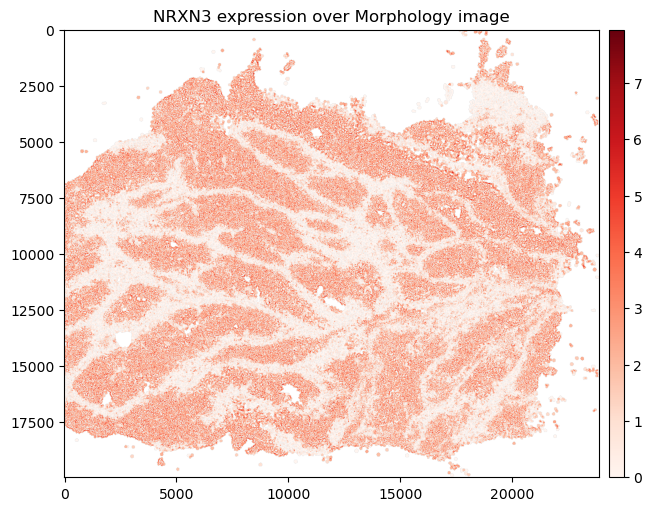

In [75]:
gene_name = "NRXN3"
crop_sdata.pl.render_shapes(
    "cell_circles",
    color=gene_name,
    cmap="Reds"
).pl.show(title=f"{gene_name} expression over Morphology image", coordinate_systems="global", figsize=(10, 5))

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


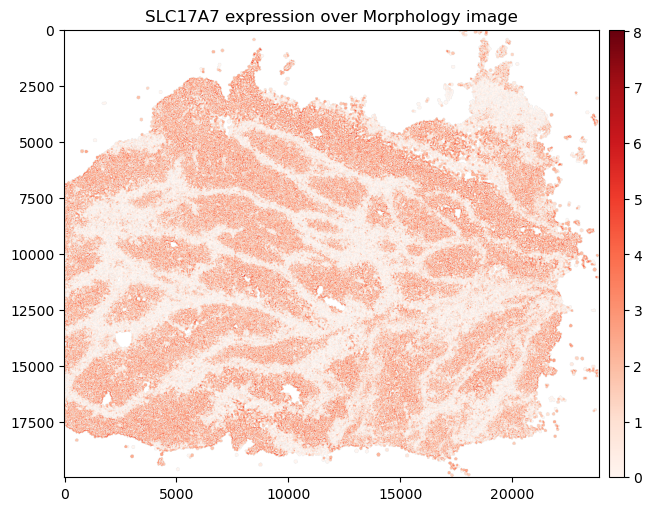

In [76]:
gene_name = "SLC17A7"
crop_sdata.pl.render_shapes(
    "cell_circles",
    color=gene_name,
    cmap="Reds"
).pl.show(title=f"{gene_name} expression over Morphology image", coordinate_systems="global", figsize=(10, 5))

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


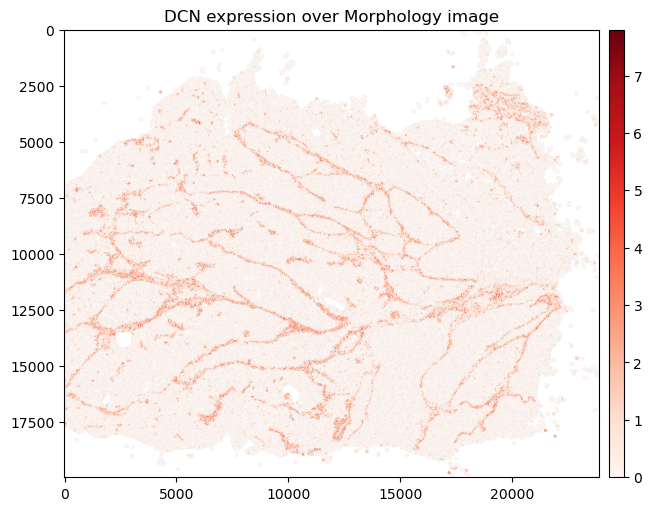

In [77]:
gene_name = "DCN"
crop_sdata.pl.render_shapes(
    "cell_circles",
    color=gene_name,
    cmap="Reds"
).pl.show(title=f"{gene_name} expression over Morphology image", coordinate_systems="global", figsize=(10, 5))

### Save spatialdata object

To complete this tutorial, we save the processed cropped spatialData object in a new Zarr folder.

In [78]:
outdir = "/storage/nhecker/spatial/data/bia/S-BIAD1093/xenium/"
path_cr_spatialdata = outdir + "/processed_cropped_MB299.zarr"

In [79]:
crop_sdata.write(path_cr_spatialdata, overwrite=True)